In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir
from sklearn.preprocessing import scale
from pyclustertend import hopkins, vat, ivat
import matplotlib.pyplot as plt
from tqdm.autonotebook import tqdm

/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/tqdm/autonotebook.py:17: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.clusterability.hopkins import hopkins_statistic

In [4]:
from avgn.clusterability.VAT import ordered_dissimilarity_matrix, ivat_ordered_dissimilarity_matrix

In [5]:
datasets = list(DATA_DIR.glob('embeddings/*/*.pickle'))
len(datasets)

83

In [6]:
def remove_outliers(z, pct = 99.5):
    """ GPU based UMAP algorithm produces some outliers that UMAP does not, but is much faster
    this is a quick fix for that. 
    """
    _min = np.percentile(z, (100-pct), axis=0)
    _max = np.percentile(z, pct, axis=0)
    for col in range(np.shape(z)[1]):
        mask = z[:,col] < _min[col]
        z[mask,col] = _min[col]
        mask = z[:,col] > _max[col]
        z[mask,col] = _max[col]
    return z

(4101, 32, 20)

In [18]:
np.shape()

(4101, 640)

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC592.pickle (4101, 640)


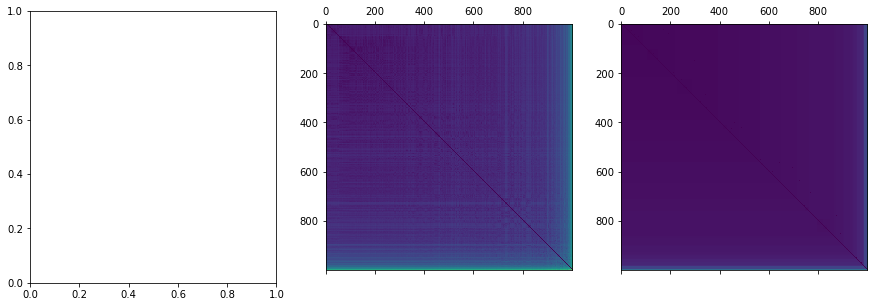

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC591.pickle (7856, 640)


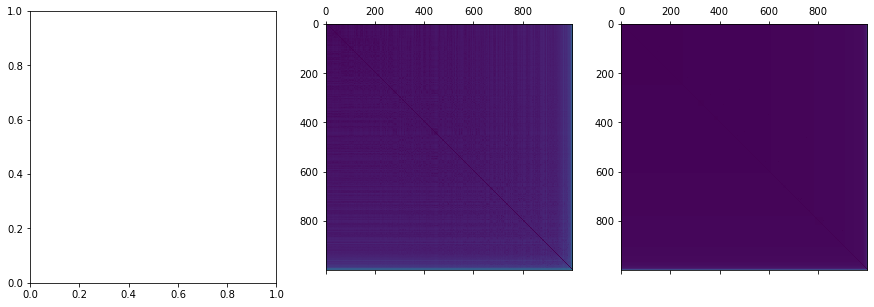

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC597.pickle (1575, 640)


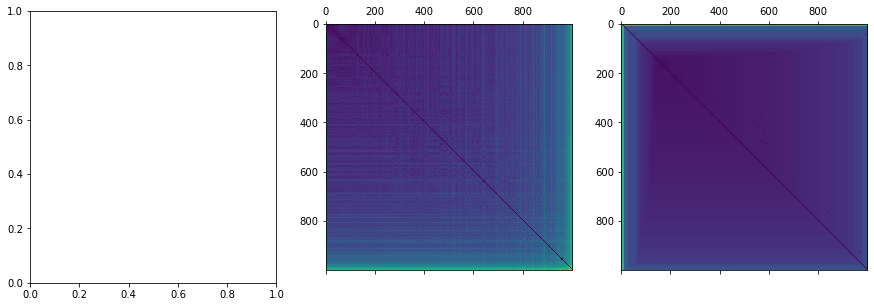

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/castellucci_mouse_usv_segmented/VOC594.pickle (8302, 640)


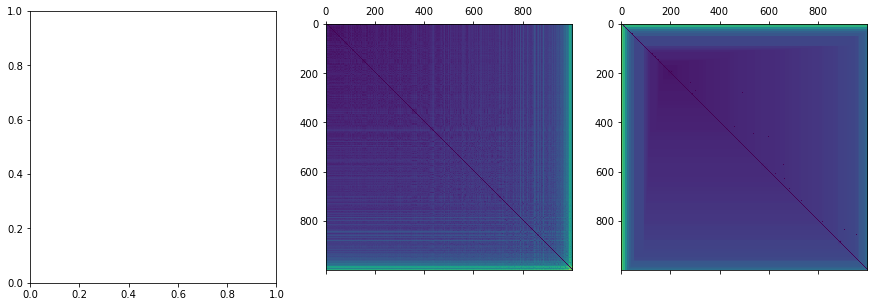

/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "


/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/BIRD_DB_Vireo_cassinii/full.pickle (67032, 992)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


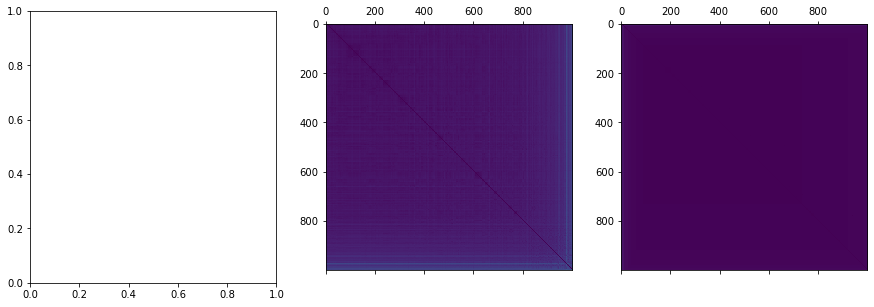

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/gibbon_morita_segmented/full.pickle (9220, 1088)


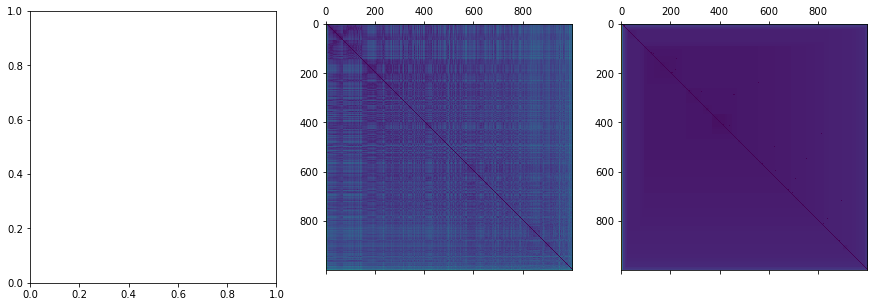

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/or60yw70.pickle (35799, 640)


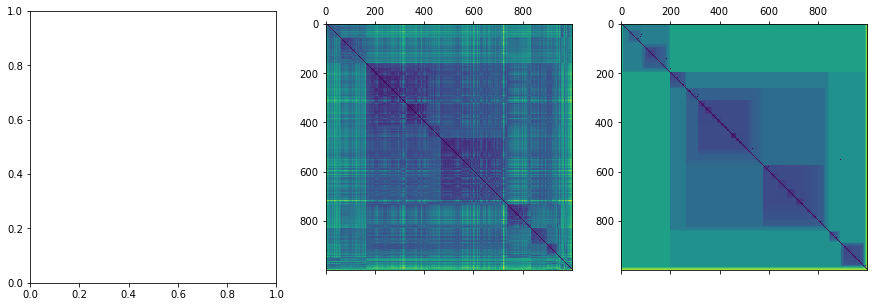

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/gr41rd51.pickle (52788, 640)


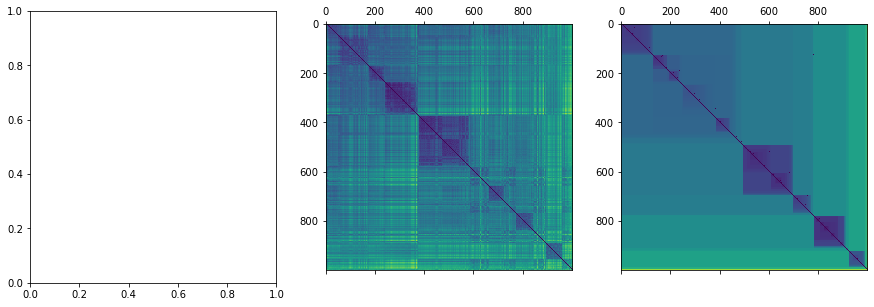

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/bl26lb16.pickle (70701, 640)


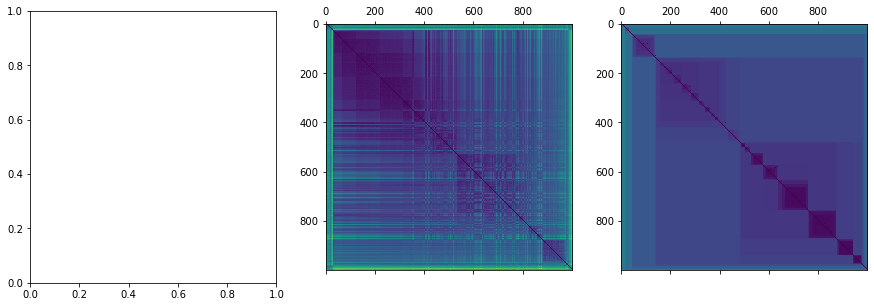

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/bengalese_finch_sober/gy6or6.pickle (56375, 640)


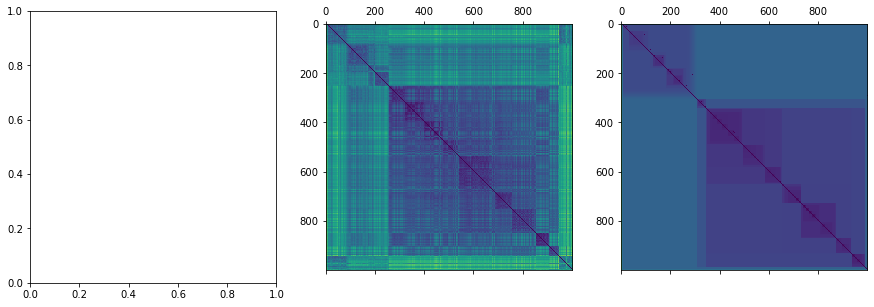

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/BIRD_DB_Toxostoma_redivivum/full.pickle (15546, 768)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


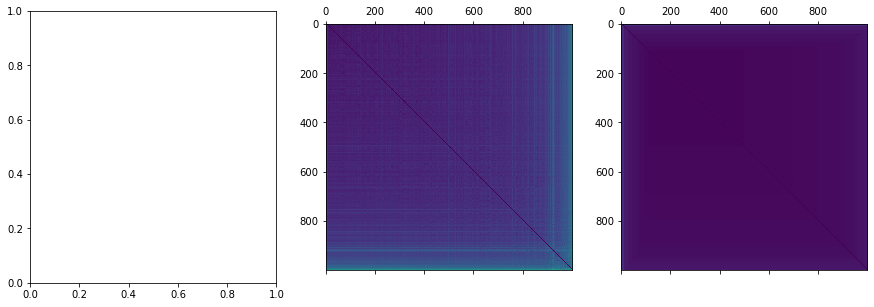

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/buckeye/human_full.pickle (837207, 768)


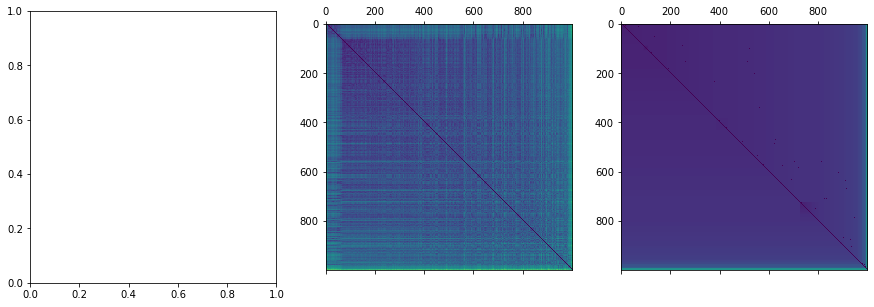

/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "


/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/swamp_sparrow/full.pickle (97573, 704)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


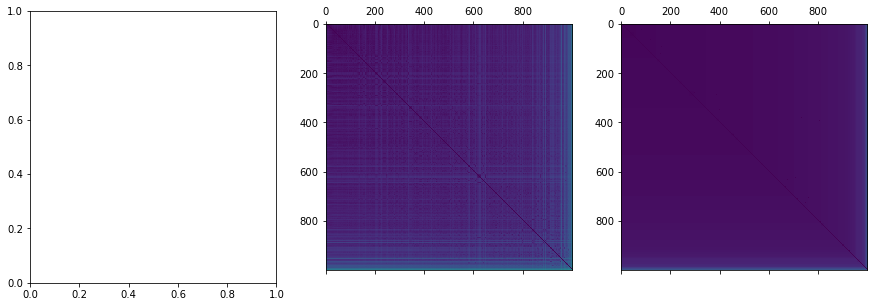

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/mobysound_humpback_whale/full.pickle (2310, 768)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


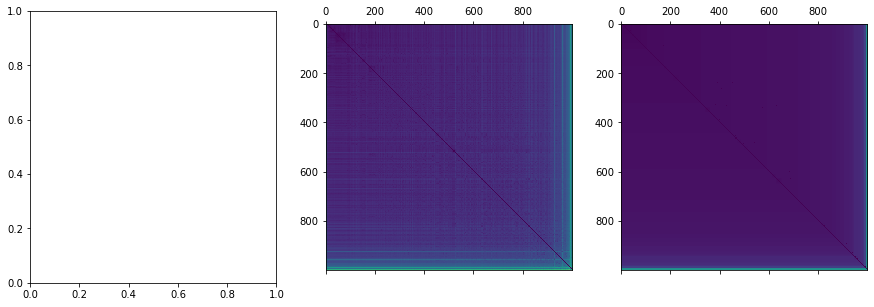

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird4.pickle (26891, 3392)


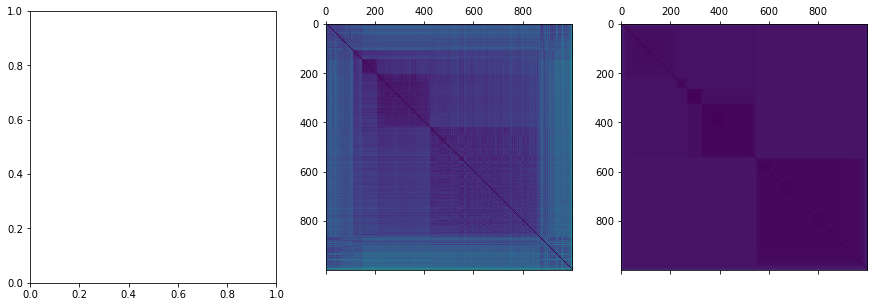

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird3.pickle (29470, 3392)


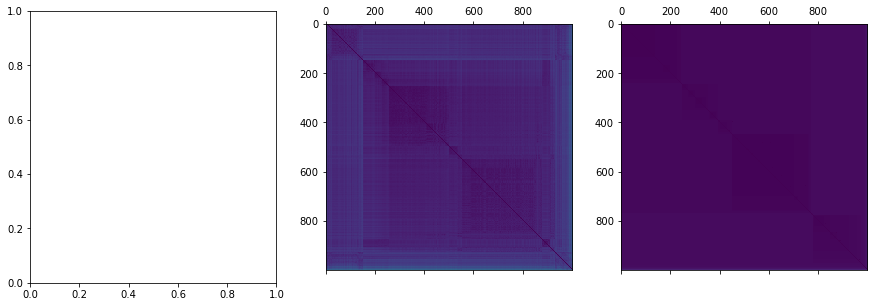

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird1.pickle (35606, 3392)


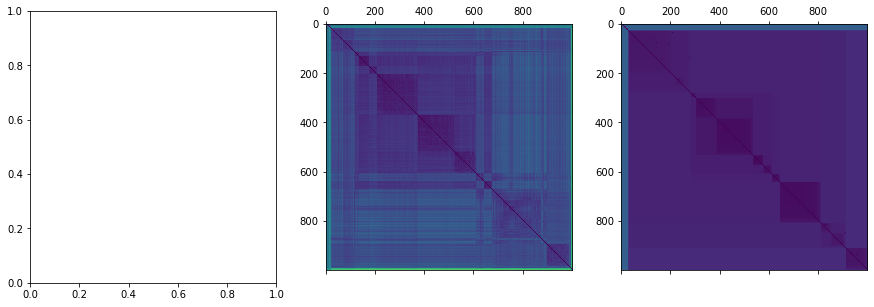

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird10.pickle (5743, 3392)


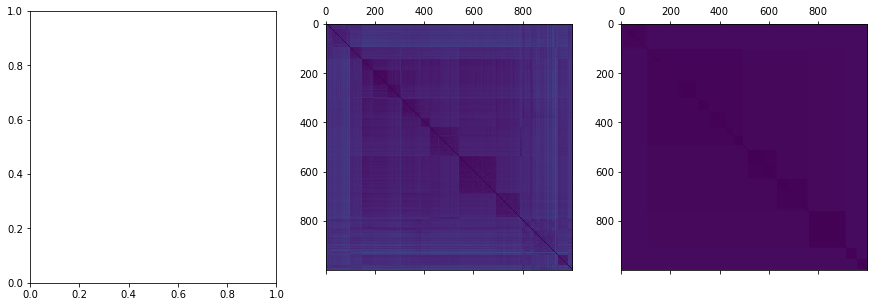

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird9.pickle (19541, 3392)


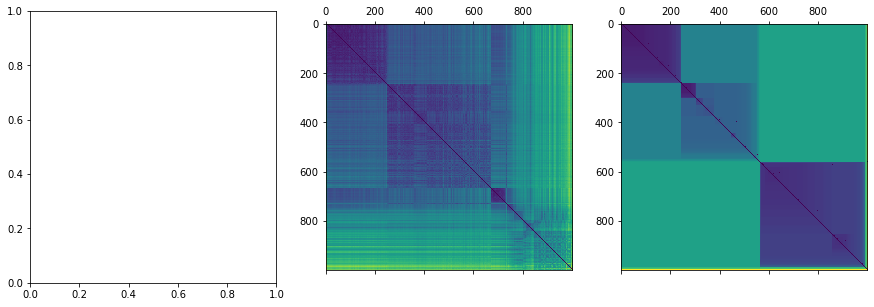

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird6.pickle (17653, 3392)


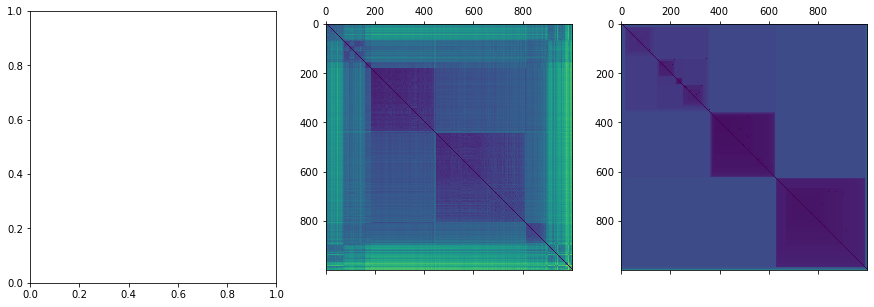

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird5.pickle (20525, 3392)


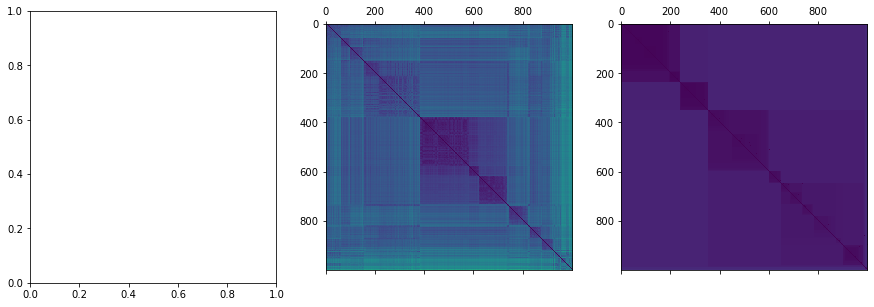

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird0.pickle (7652, 3392)


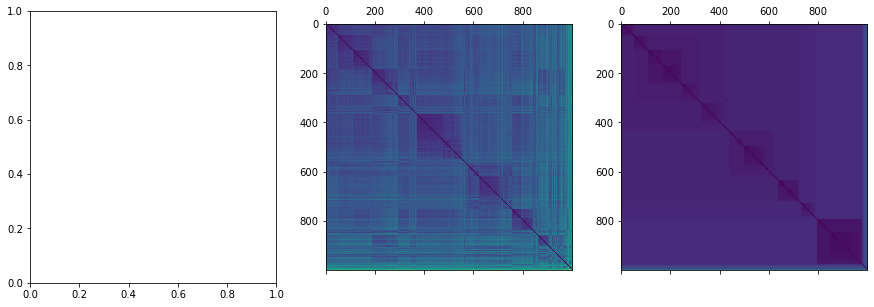

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird8.pickle (4985, 3392)


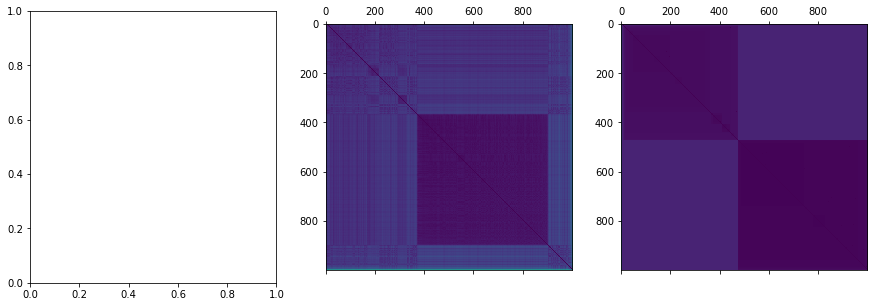

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird2.pickle (26127, 3392)


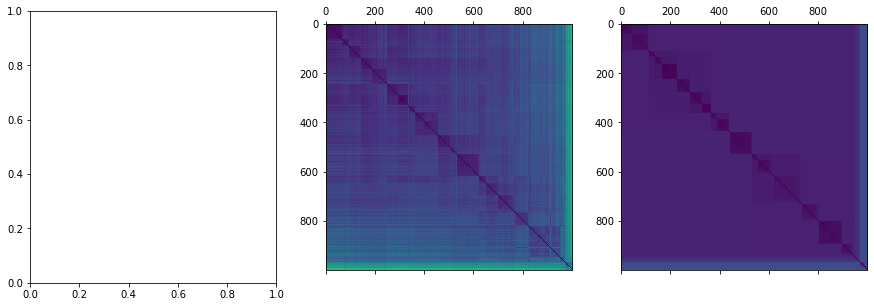

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/koumura_bengalese_finch/Bird7.pickle (20722, 3392)


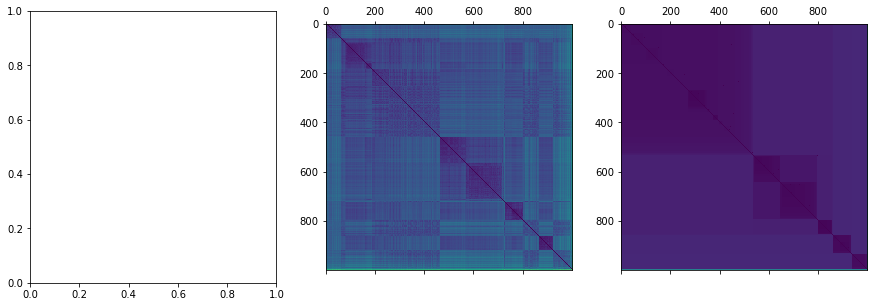

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM34.pickle (3039, 704)


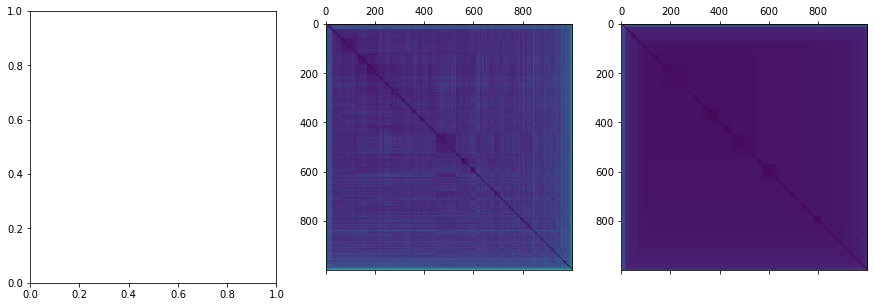

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM14.pickle (1533, 704)


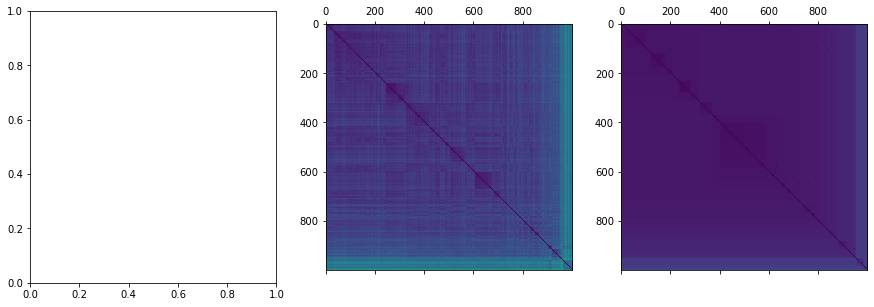

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM31.pickle (3468, 704)


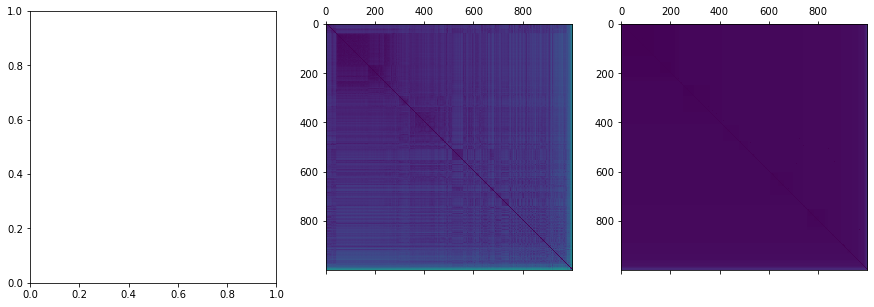

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM37.pickle (2214, 704)


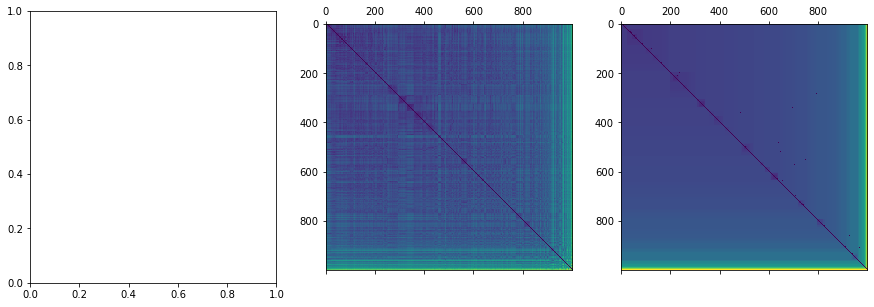

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM16.pickle (2515, 704)


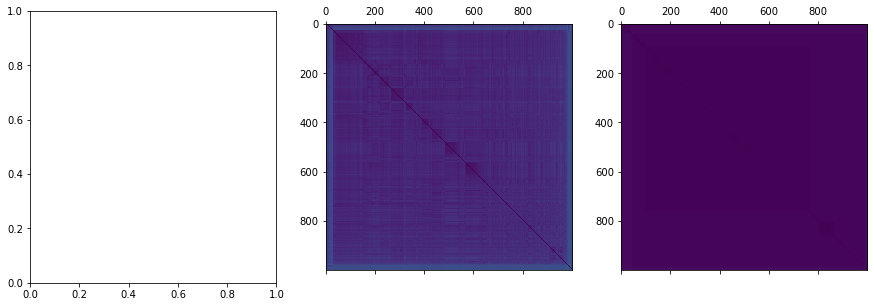

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM25.pickle (598, 704)


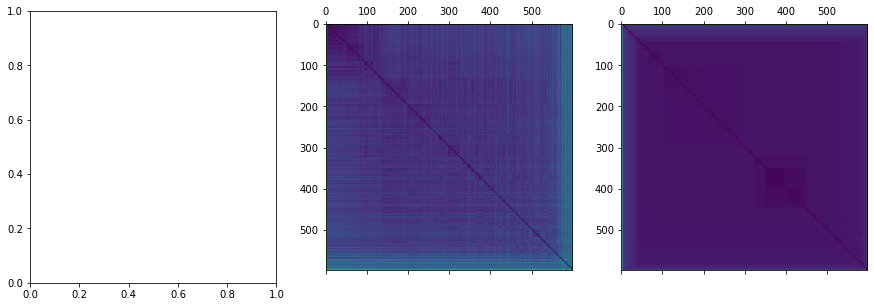

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM19.pickle (1285, 704)


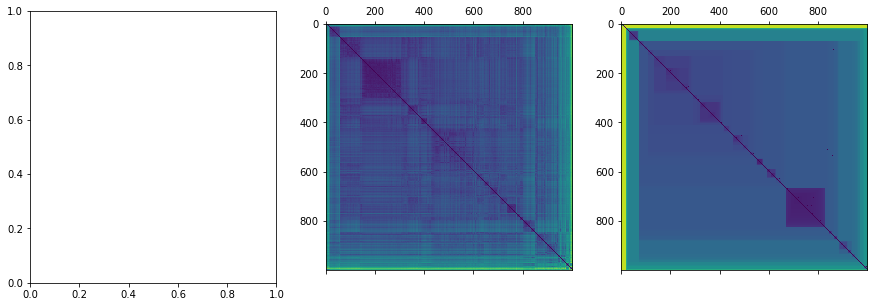

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM03.pickle (2446, 704)


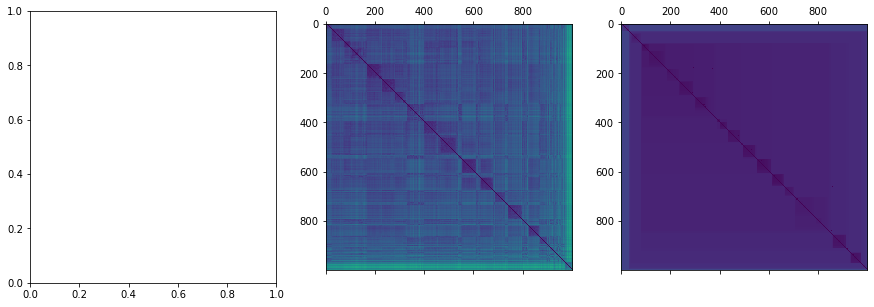

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM04.pickle (2346, 704)


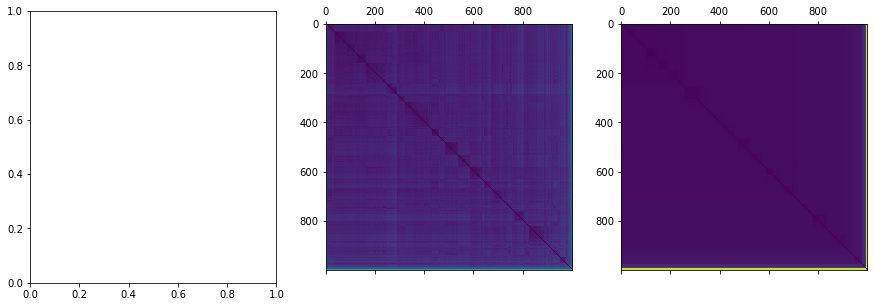

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM09.pickle (1306, 704)


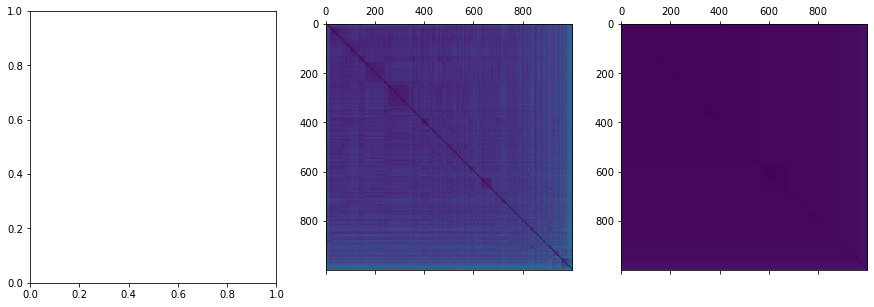

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM13.pickle (1538, 704)


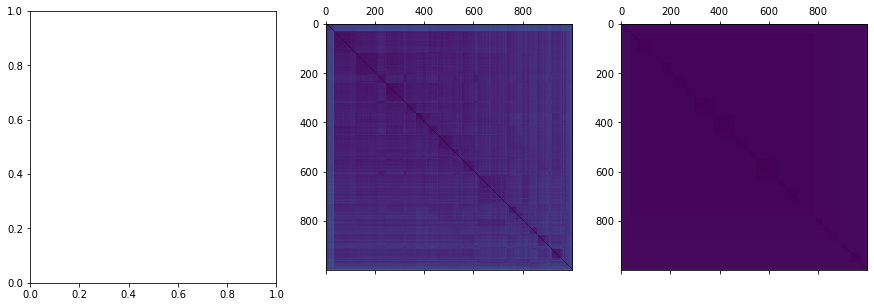

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM21.pickle (2542, 704)


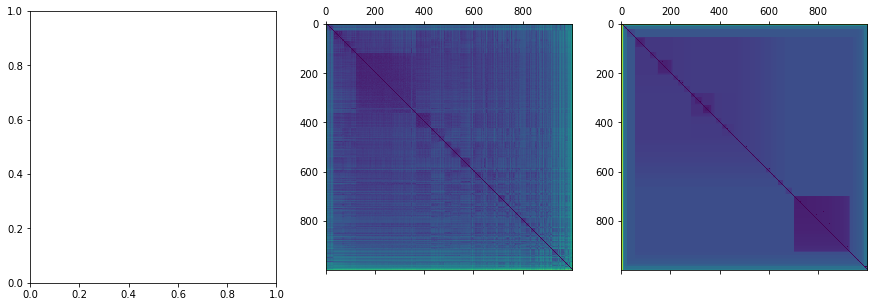

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM27.pickle (3734, 704)


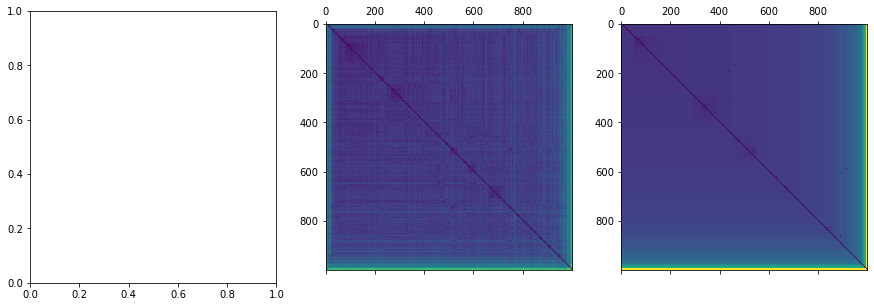

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM40.pickle (9190, 704)


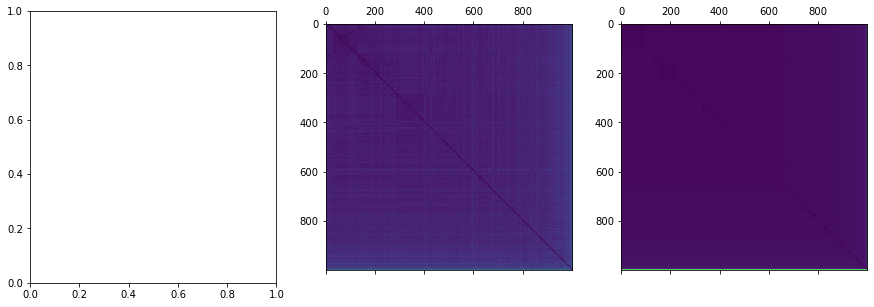

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM33.pickle (3308, 704)


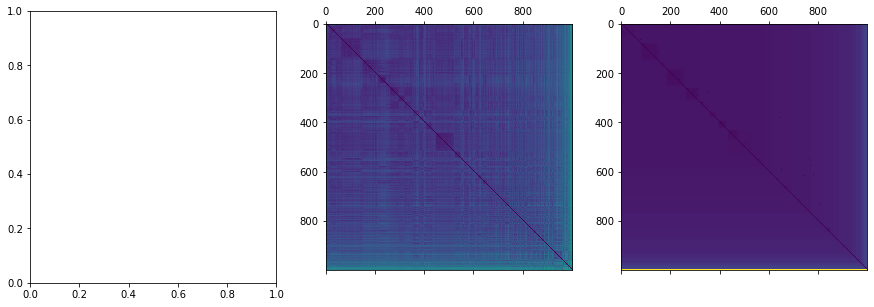

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM35.pickle (2290, 704)


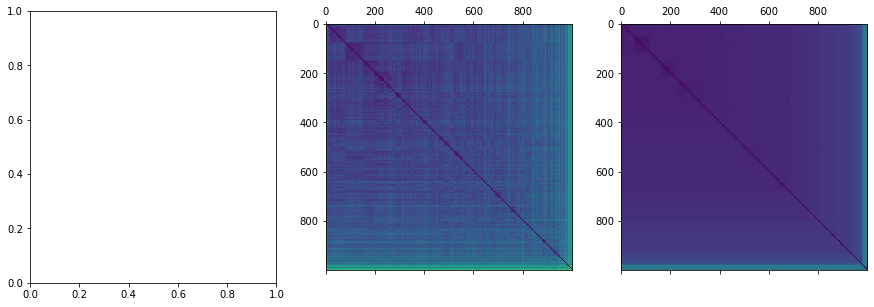

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM05.pickle (2062, 704)


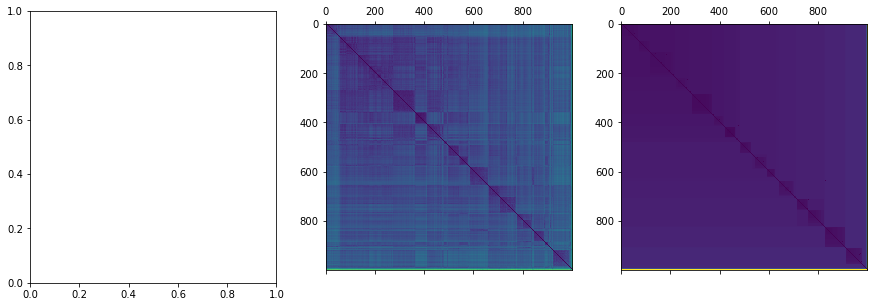

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM44.pickle (2889, 704)


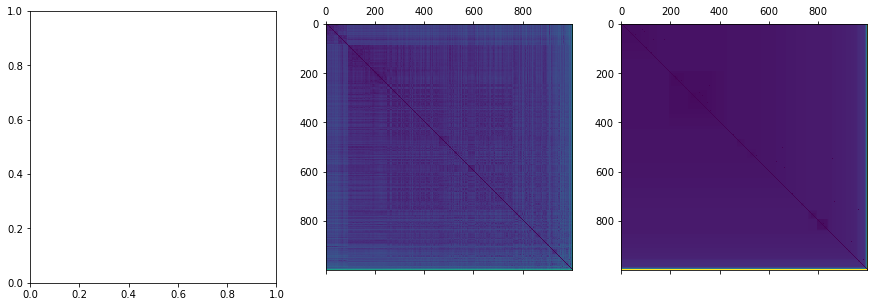

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM11.pickle (2664, 704)


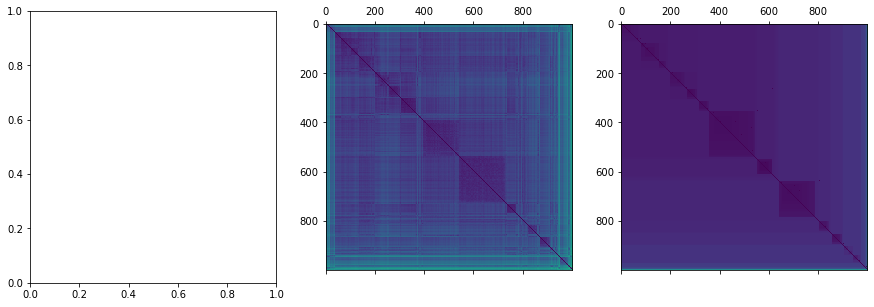

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM02.pickle (1966, 704)


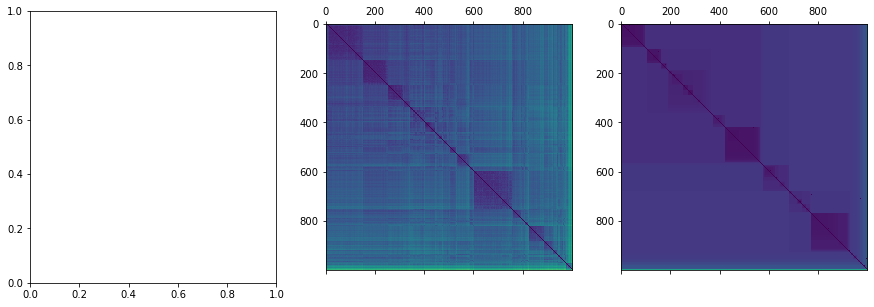

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM41.pickle (2073, 704)


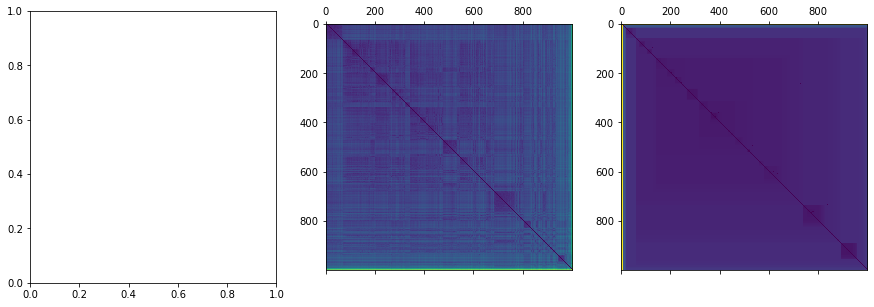

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM08.pickle (2224, 704)


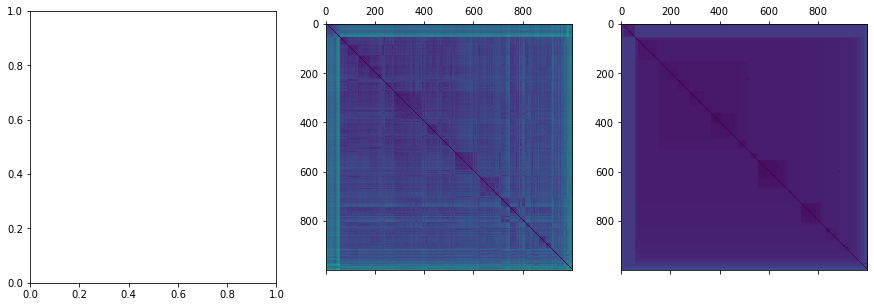

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM17.pickle (1674, 704)


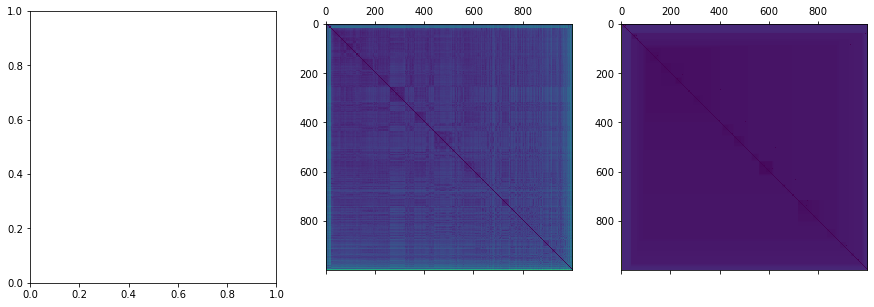

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM39.pickle (4580, 704)


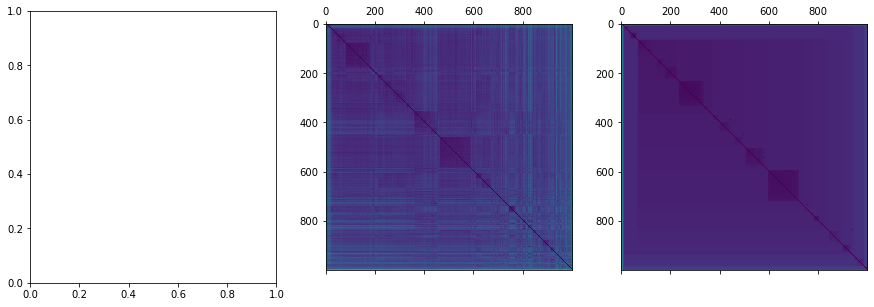

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM38.pickle (5647, 704)


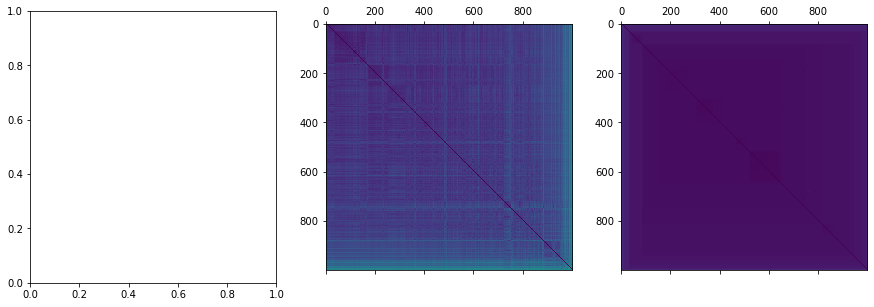

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM42.pickle (2393, 704)


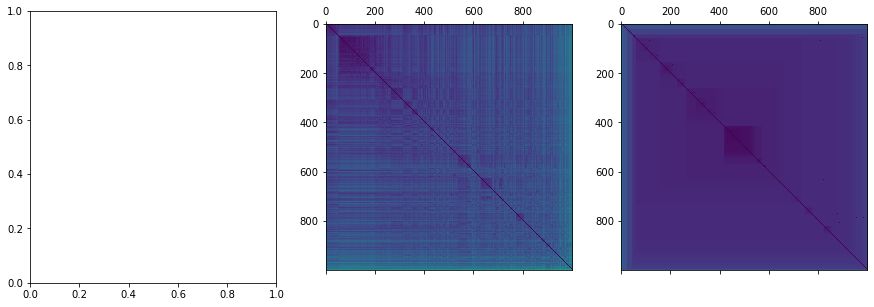

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM18.pickle (1353, 704)


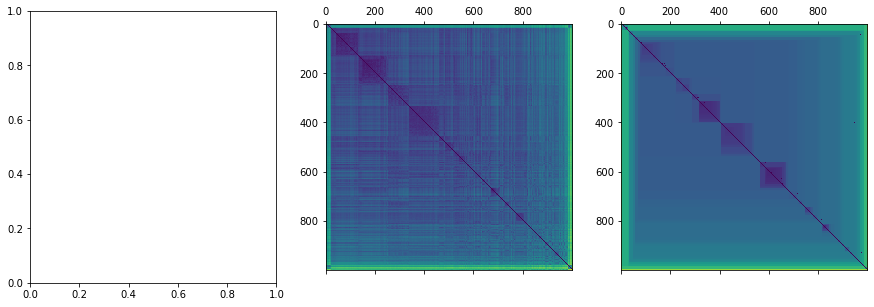

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM12.pickle (1799, 704)


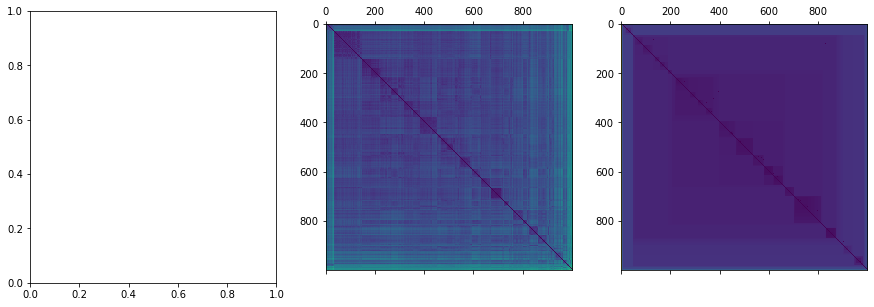

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM26.pickle (3551, 704)


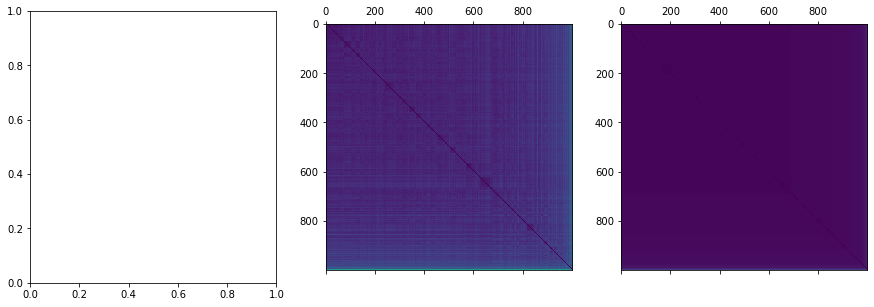

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM24.pickle (147, 704)


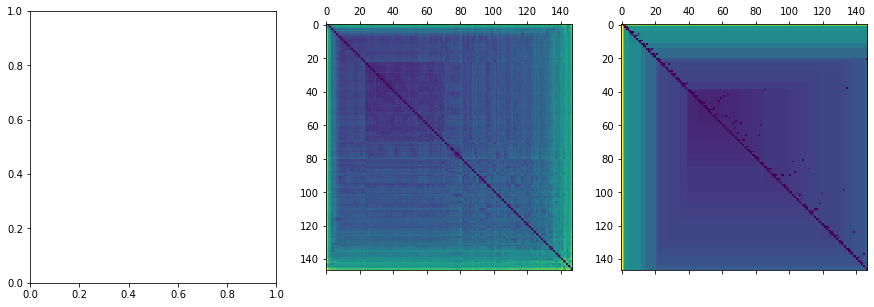

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM06.pickle (1669, 704)


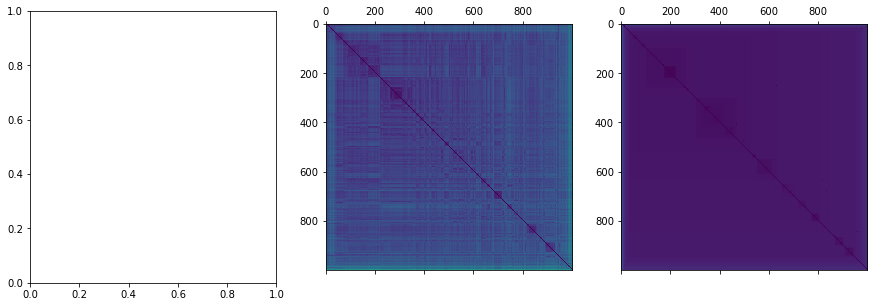

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM07.pickle (1898, 704)


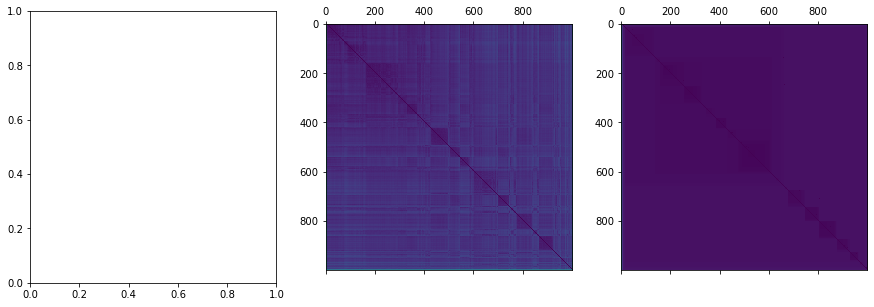

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM30.pickle (2077, 704)


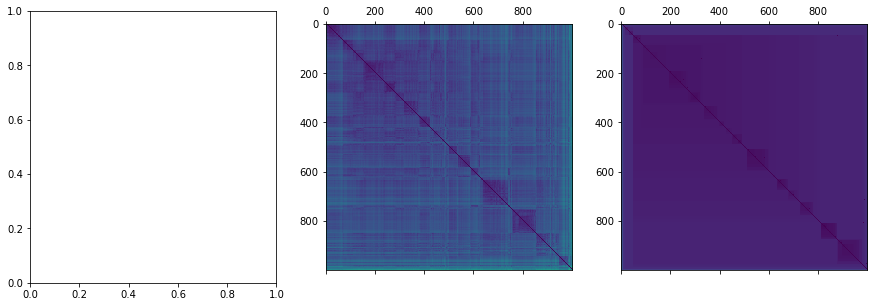

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM15.pickle (2234, 704)


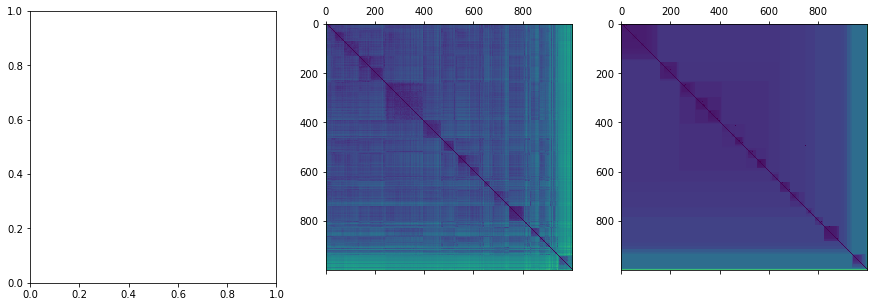

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM01.pickle (2389, 704)


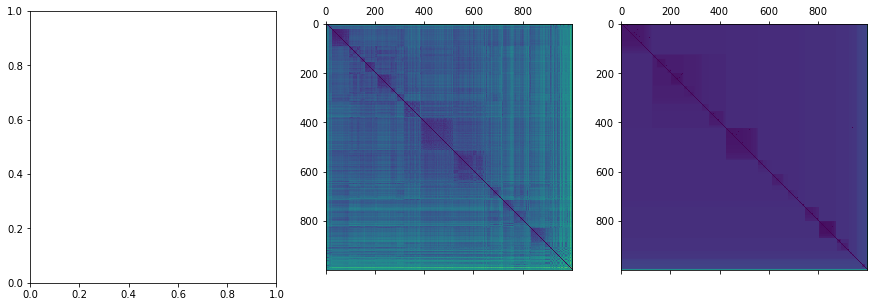

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM36.pickle (5117, 704)


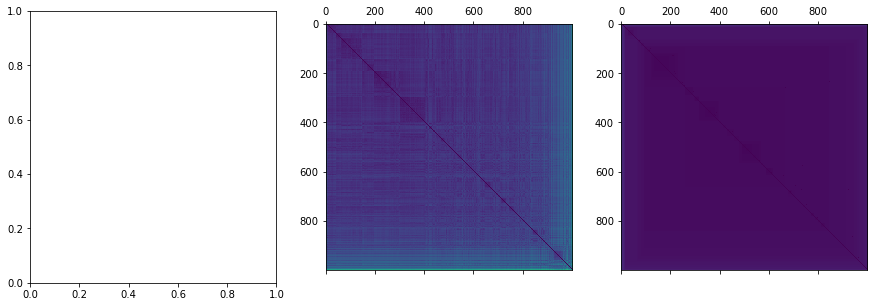

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM20.pickle (1712, 704)


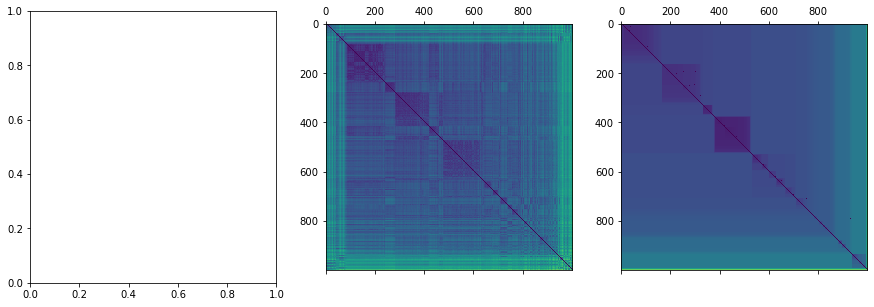

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM28.pickle (1902, 704)


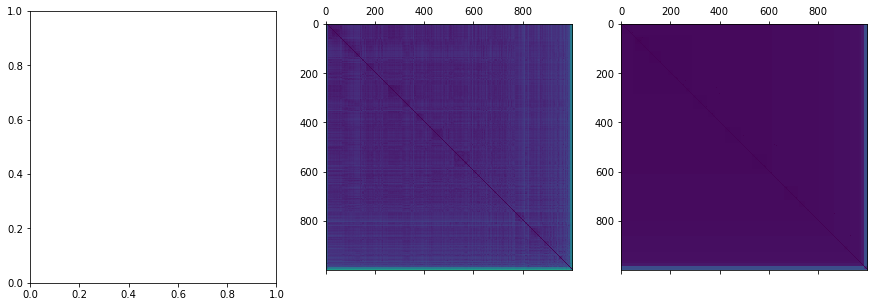

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM32.pickle (4946, 704)


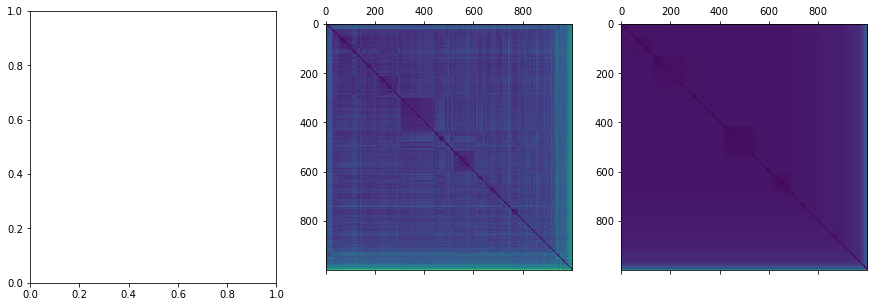

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM23.pickle (1663, 704)


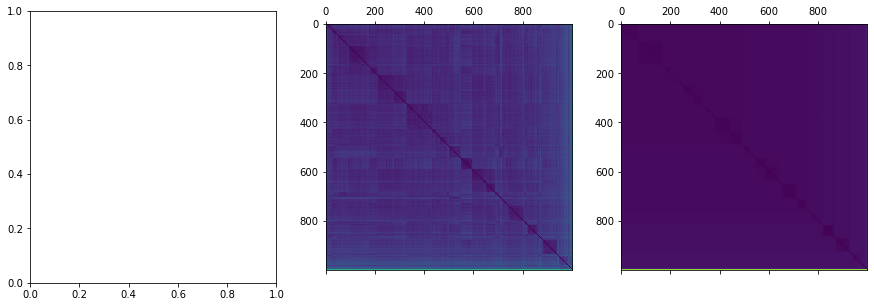

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM29.pickle (3160, 704)


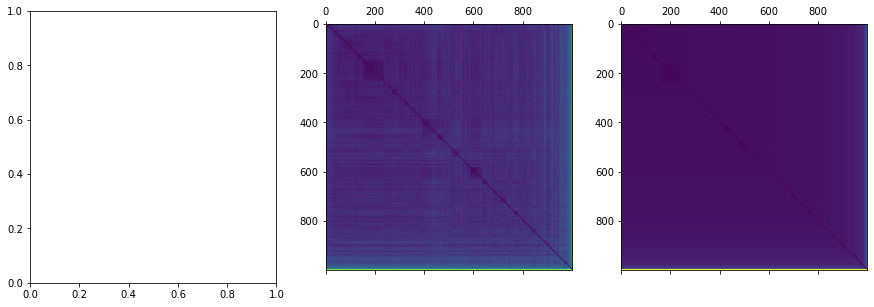

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM22.pickle (790, 704)


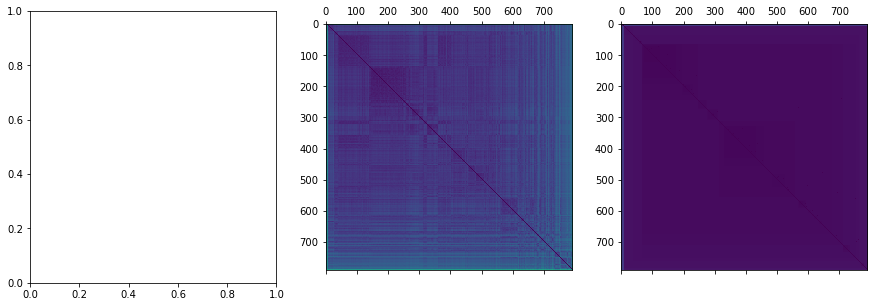

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM10.pickle (2068, 704)


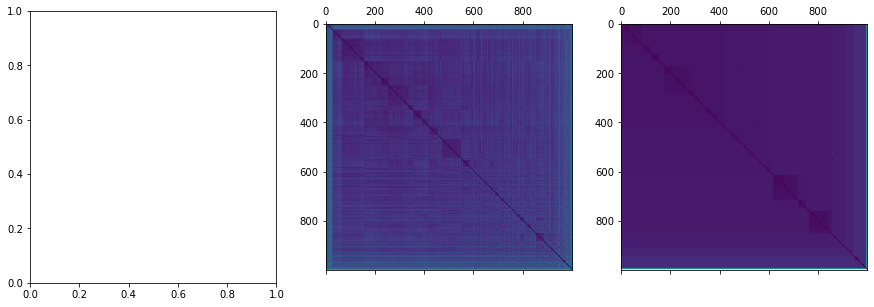

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/katahira_white_munia_segmented/WM43.pickle (1501, 704)


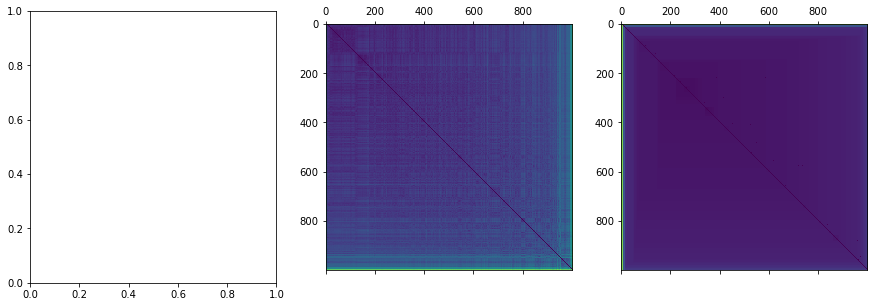

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr28.pickle (12067, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


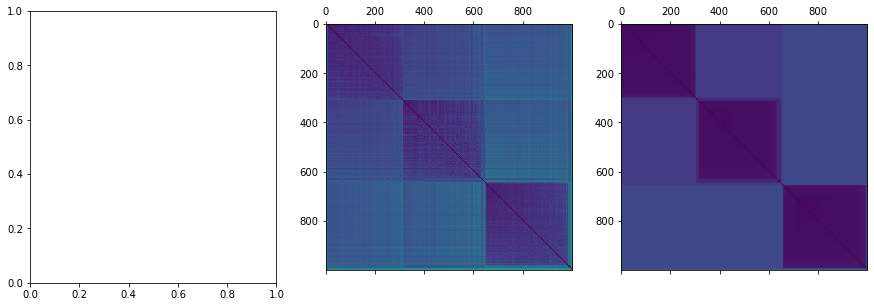

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lny42.pickle (12959, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


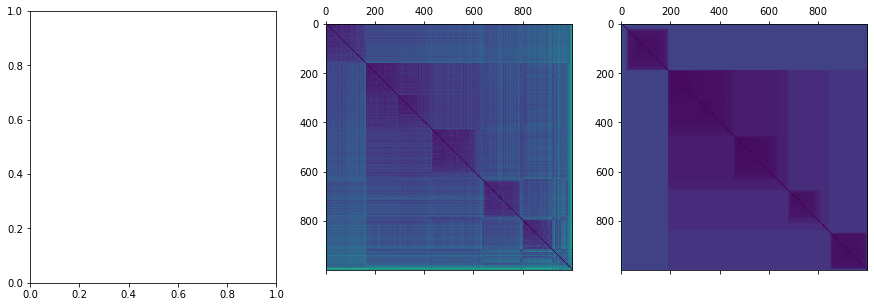

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lny64.pickle (8449, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


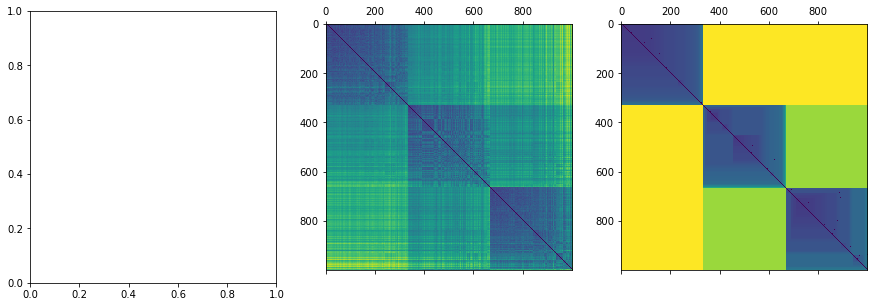

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr77.pickle (11931, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


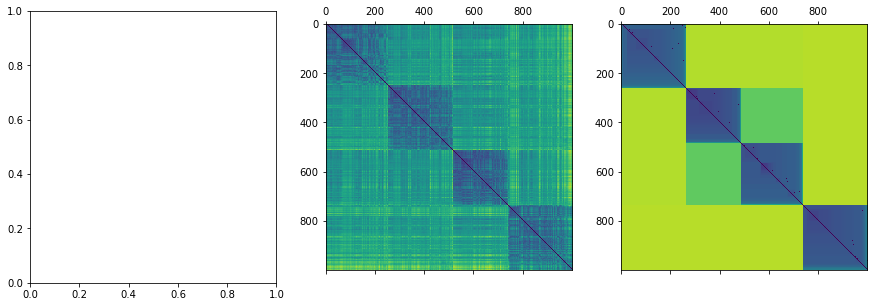

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr13.pickle (9118, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


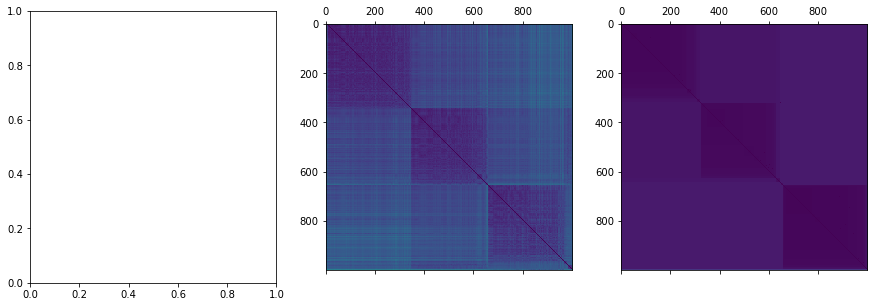

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/zebra_finch_gardner_segmented/lr12.pickle (11369, 576)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


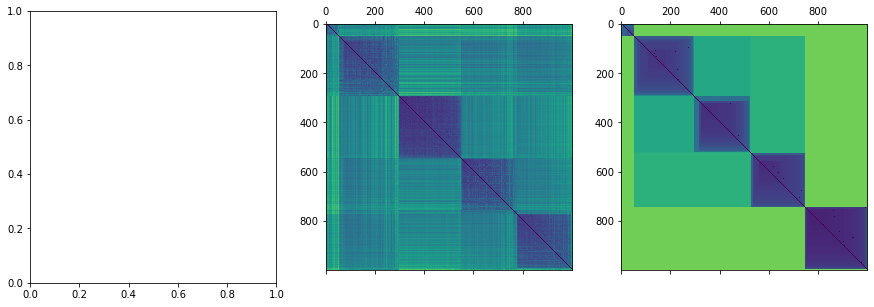

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/giant_otter/full.pickle (453, 992)


/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/AD/tsainbur/anaconda3/envs/py19/lib/python3.6/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


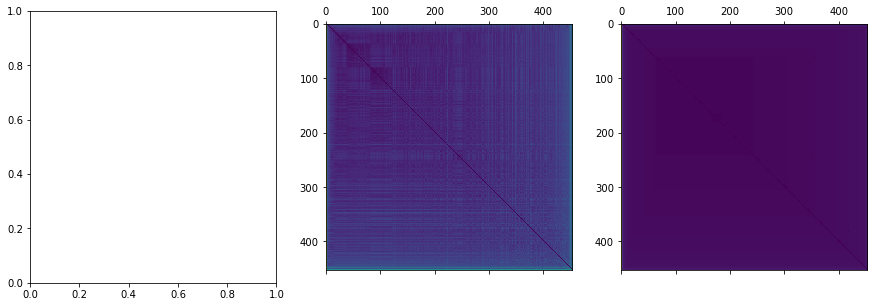

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1076.pickle (25406, 864)


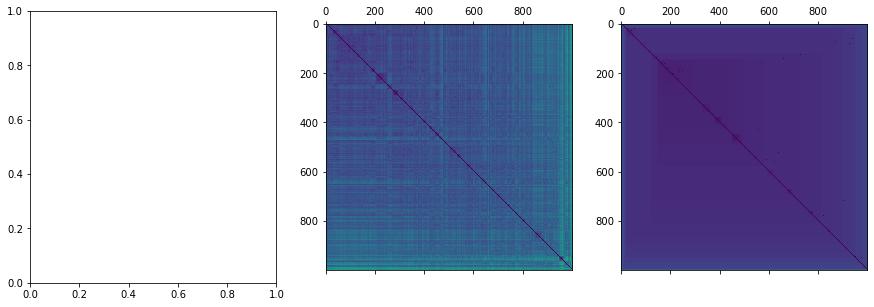

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1053.pickle (24110, 864)


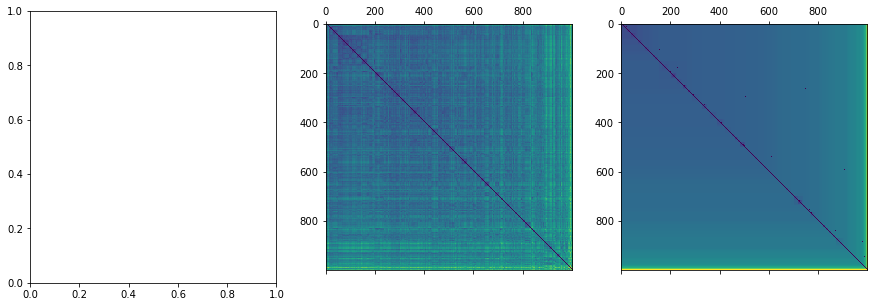

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1060.pickle (65871, 864)


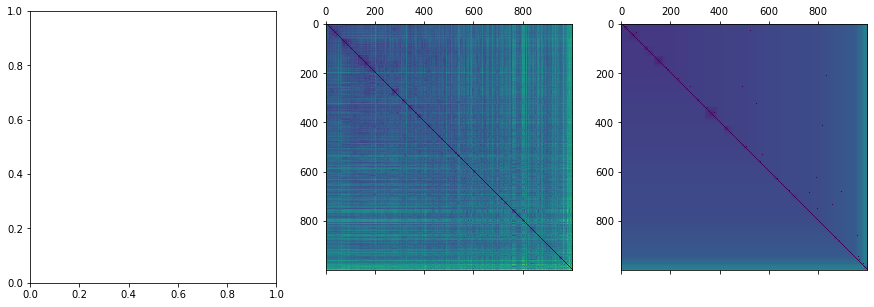

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1125.pickle (2702, 864)


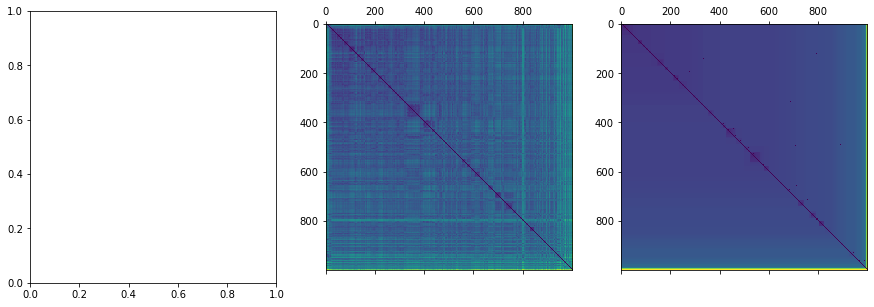

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1143.pickle (5316, 864)


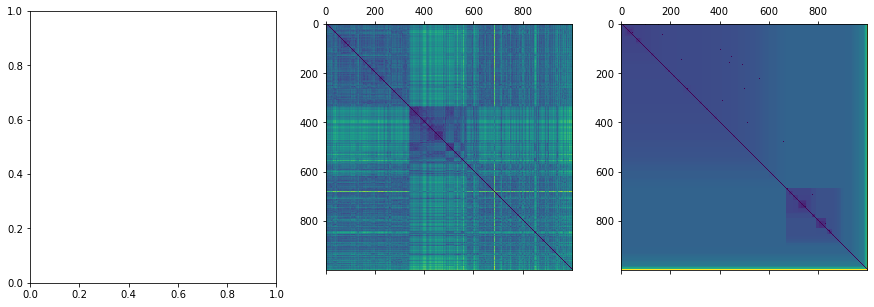

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1077.pickle (18570, 864)


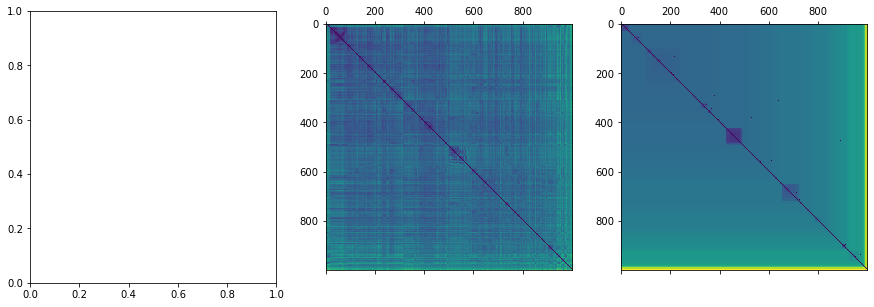

/local/home/tsainbur/github_repos/avgn_paper/data/embeddings/european_starling_gentner_segmented/b1066.pickle (22259, 864)


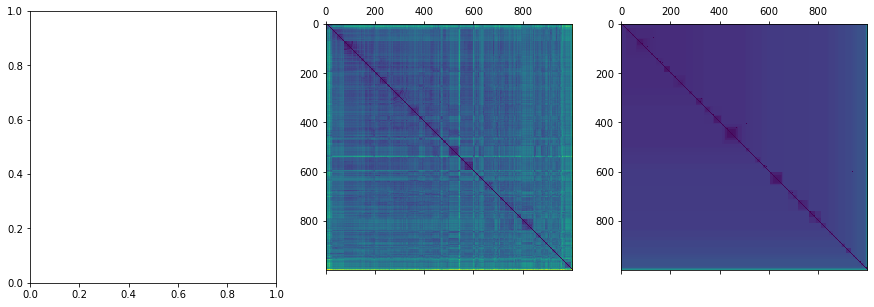

In [19]:
nex_max = 1000
clusterability_df = pd.DataFrame(columns=[
    'df', 'dataset', 'indv', 'sampled_indices', 'VAT', 'iVAT', 'order'
])
for dataset in tqdm(datasets):
    specs = np.stack(pd.read_pickle(dataset)[['spectrogram']].spectrogram.values)
    specs = specs.reshape(len(specs),-1)
    specs = scale(specs)
    print(dataset, np.shape(specs))
    if len(specs) <= nex_max:
        samples = np.arange(len(specs))
    else:
        samples = np.random.choice(np.arange(len(specs)), nex_max)
    VAT, order = ordered_dissimilarity_matrix(specs[samples])
    iVAT = ivat_ordered_dissimilarity_matrix(VAT)
    
    fig, axs = plt.subplots(ncols = 3, figsize=(15,5))
    axs[1].matshow(VAT)
    axs[2].matshow(iVAT)
    plt.show()

    clusterability_df.loc[len(clusterability_df)] = [
        dataset, dataset.parent.stem, dataset.stem, samples, VAT, iVAT, order
    ]

In [ ]:
fig, axs = plt.subplots(ncols = 3, figsize=(15,5))
axs[0].scatter(umap_proj[:, 0], umap_proj[:, 1], s=1, color='k', alpha=0.1)
axs[1].matshow(VAT)
axs[2].matshow(iVAT)
plt.show()

In [ ]:
np.shape(umap_proj)

In [ ]:
clusterability_df[:3]

In [ ]:
clusterability_df.dataset.unique()

In [20]:
species_dict = {
    'castellucci_mouse_usv_segmented': {
        'species': 'Mouse',
        'group': 'mammal'
    },
    'BIRD_DB_Vireo_cassinii': {
        'species': 'Cassin\'s vireo',
        'group': 'songbird'
    },
    'gibbon_morita_segmented': {
        'species': 'Gibbon',
        'group': 'mammal'
    },
    'bengalese_finch_sober': {
        'species': 'Bengalese finch',
        'group': 'songbird'
    },
    'buckeye': {
        'species': 'Human (English)',
        'group': 'mammal'
    },
    'swamp_sparrow': {
        'species': 'Swamp sparrow',
        'group': 'songbird'
    },
    'mobysound_humpback_whale': {
        'species': 'Humpback whale',
        'group': 'mammal'
    },
    'koumura_bengalese_finch': {
        'species': 'Bengalese finch',
        'group': 'songbird'
    },
    'giant_otter': {
        'species': 'Giant otter',
        'group': 'mammal'
    },
    'BIRD_DB_Toxostoma_redivivum': {
        'species': 'California thrasher',
        'group': 'songbird'
    },
    'zebra_finch_gardner_segmented': {
        'species': 'Zebra finch',
        'group': 'songbird'
    },
    'katahira_white_munia_segmented': {
        'species': 'White-rumped munia',
        'group': 'songbird'
    },
    'european_starling_gentner_segmented': {
        'species': 'European starling',
        'group': 'songbird'
    },
}

In [21]:
clusterability_df['species'] = [species_dict[ds]['species']  for ds in clusterability_df['dataset'].values]
clusterability_df['family'] = [species_dict[ds]['group']  for ds in clusterability_df['dataset'].values]

In [22]:
import seaborn as sns

In [23]:
clusterability_df[:3]

,df,dataset,indv,sampled_indices,VAT,iVAT,order,species,family
0,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC592,"[842, 3380, 3520, 3744, 116, 1723, 3934, 2900,...","[[0.0, 136.8642410809448, 137.5591417660391, 1...","[[0.0, 0.0, 29.46537294687815, 29.465372946878...","[[0.0, 21.416058676034655, 17.911872399038607,...",Mouse,mammal
1,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC591,"[4392, 1305, 453, 3181, 2684, 7399, 7730, 1192...","[[0.0, 126.30110924296541, 181.99292433731551,...","[[0.0, 0.0, 29.67522577460185, 29.675225774601...","[[0.0, 17.812599580969753, 17.625203923924325,...",Mouse,mammal
2,/local/home/tsainbur/github_repos/avgn_paper/d...,castellucci_mouse_usv_segmented,VOC597,"[1494, 303, 752, 139, 799, 1405, 311, 1556, 52...","[[0.0, 0.0, 103.08480344456947, 112.3789534085...","[[0.0, 0.0, 0.0, 559.3665779232679, 559.366577...","[[0.0, 17.55864067471602, 17.227275076946736, ...",Mouse,mammal


In [24]:
len(clusterability_df)

83

In [25]:
ensure_dir(DATA_DIR / 'clusterability' / 'clusterability_df.pickle')

In [26]:
clusterability_df.to_pickle(DATA_DIR / 'clusterability' / 'clusterability_df.pickle')